# Vamos a probar hacer una clasificación las noticias del dataset

Utilizamos un Bert que agarre cada noticia y la pase a un sentence embedding

Probamos con 3 berts (ROUBERTA, Rubertuito, BETO)

Luego agarramos cada embbeding y los mapeamos a un espacio 2D y vemos si se forma algún cluster

A ojo sacamos la cantidad de K optima y aplicamos KNN

In [5]:
import json
import numpy as np
import pandas as pd

In [2]:
from tokenizers import Tokenizer
tok = Tokenizer.from_file("tokenizer.json")

In [2]:
with open("processed/meta.json") as f:
    meta = json.load(f)

dtype = getattr(np, meta["dtype"])
eos_id = meta["eos_id"]
ids = np.memmap("processed/test.bin", dtype=dtype, mode="r")

ends = np.where(ids == eos_id)[0]

NameError: name 'json' is not defined

In [32]:
start = 0
filas = []
for i,e in enumerate(ends):
    texto = tok.decode(ids[start:e])
    print(texto)
    fila = {
        "id": i,
        "noticia": texto
    }
    filas.append(fila)
    print(i, len(ends))
    start = e + 1
df = pd.DataFrame(filas)

La Administración de Drogas y Alimentos (FDA) de Estados Unidos autorizó este martes la primera prueba de covid-19 para hacerse en casa, que se puede comprar sin receta y da el resultado en unos 20 minutos. La prueba, que fabrica Ellume, con sede en California, se venderá por unos US$ 30 y la compañía planea lanzar tres millones de unidades en enero de 2021. Stephen Hahn, comisionado de la FDA, dijo que la autorización de uso de emergencia para esta prueba representa un "hito importante". "Estamos ayudando a ampliar el acceso de los estadounidenses a las pruebas de diagnóstico, reduciendo la carga de los laboratorios y del suministro de los test, brindando más opciones desde la comodidad y seguridad de sus propios hogares", señaló. Es una prueba de "antígeno", lo que significa que funciona detectando una molécula de superficie del coronavirus, a diferencia de las pruebas de PCR que buscan el material genético del virus. La tecnología usada es similar a la de un test de embarazo. La pru

In [119]:
df.head


<bound method NDFrame.head of           step  split      loss        lr  elapsed_min   kind source_file
0            0  train  9.811438  0.000001     0.089249   eval  losses.csv
2            0  train  9.807938  0.000001     0.092087  train  losses.csv
1            0    val  9.811837  0.000001     0.089249   eval  losses.csv
3           10  train  9.319555  0.000016     0.096838  train  losses.csv
4           20  train  9.040510  0.000031     0.101673  train  losses.csv
...        ...    ...       ...       ...          ...    ...         ...
103672  959970  train  3.220332  0.000030   343.383099  train  losses.csv
103673  959980  train  3.127214  0.000030   343.387779  train  losses.csv
103674  959990  train  3.086549  0.000030   343.392468  train  losses.csv
103675  960000  train  3.092411  0.000030   343.422840   eval  losses.csv
103676  960000    val  3.103506  0.000030   343.422840   eval  losses.csv

[103677 rows x 7 columns]>

In [34]:
df.to_csv("noticias-test.csv", index=False)

In [5]:
from transformers import AutoTokenizer, AutoModel

model_name = "intfloat/multilingual-e5-large"

tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModel.from_pretrained(model_name)

Loading weights: 100%|██████████| 391/391 [00:00<00:00, 7709.94it/s]


In [8]:
df = pd.read_csv("data/noticias-test.csv")
df["noticia"]

0       La Administración de Drogas y Alimentos (FDA) ...
1       En un comunicado, Sony dijo que la edición que...
2       Tres personas fueron condenadas a un año de cá...
3       La presidenta argentina, Cristina Fernández, y...
4       Las ediciones 2020 de las fases finales de la ...
                              ...                        
4463    Se viene una nueva revista para la temporada v...
4464    FútbolUy. Seguinos en Twitter @futbolportaluy....
4465    El presidente boliviano, Evo Morales, ganó en ...
4466    El intendente de Salto, Andrés Lima, presentar...
4467    Juan Darthés decidió armar las valijas y parti...
Name: noticia, Length: 4468, dtype: str

In [6]:
model.to("mps")

XLMRobertaModel(
  (embeddings): XLMRobertaEmbeddings(
    (word_embeddings): Embedding(250002, 1024, padding_idx=1)
    (token_type_embeddings): Embedding(1, 1024)
    (LayerNorm): LayerNorm((1024,), eps=1e-05, elementwise_affine=True, bias=True)
    (dropout): Dropout(p=0.1, inplace=False)
    (position_embeddings): Embedding(514, 1024, padding_idx=1)
  )
  (encoder): XLMRobertaEncoder(
    (layer): ModuleList(
      (0-23): 24 x XLMRobertaLayer(
        (attention): XLMRobertaAttention(
          (self): XLMRobertaSelfAttention(
            (query): Linear(in_features=1024, out_features=1024, bias=True)
            (key): Linear(in_features=1024, out_features=1024, bias=True)
            (value): Linear(in_features=1024, out_features=1024, bias=True)
            (dropout): Dropout(p=0.1, inplace=False)
          )
          (output): XLMRobertaSelfOutput(
            (dense): Linear(in_features=1024, out_features=1024, bias=True)
            (LayerNorm): LayerNorm((1024,), eps=1e-05

In [ ]:
import torch

inputs_texts = ["query:" + txt for txt in  df["noticia"][:1500].to_list()]

inputs = tokenizer(inputs_texts, max_length=512, padding=True, truncation=True, return_tensors='pt')

In [10]:
model.eval()
inputs.to("mps")
with torch.no_grad():
    outputs = model(**inputs)

print(outputs.last_hidden_state.shape)

torch.Size([2000, 512, 1024])


In [7]:
cls_vectors = outputs.last_hidden_state[:, 0, :].to("cpu")

print(cls_vectors.shape)
# torch.Size([2, 768])

torch.Size([2000, 1024])


In [10]:
outputs.last_hidden_state[:, 0, :]

tensor([[ 0.4722,  1.0499, -1.1176,  ..., -0.4021,  0.5916, -0.7438],
        [ 0.4590,  0.9385, -1.1768,  ..., -0.4140,  1.0238, -0.6960],
        [ 0.3763,  0.7676, -1.0282,  ..., -0.5030,  0.7255, -0.6223],
        ...,
        [ 0.4416,  0.7720, -0.6776,  ..., -0.5707,  0.7735, -0.4603],
        [ 0.6085,  0.8529, -0.7825,  ..., -0.5676,  0.7368, -0.4882],
        [ 0.3747,  0.8403, -0.9573,  ..., -0.5619,  0.7543, -0.6119]],
       device='mps:0')

In [ ]:
from sklearn.manifold import TSNE
X = np.array(outputs.last_hidden_state[:, 0, :].to("cpu"))
X_embedded = TSNE(n_components=2, learning_rate="auto", init="random", perplexity=30).fit_transform(X)

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
neigh = KNeighborsClassifier(n_neighbors=2)
neigh.fit(X)

SyntaxError: cannot assign to expression here. Maybe you meant '==' instead of '='? (4079374933.py, line 1)

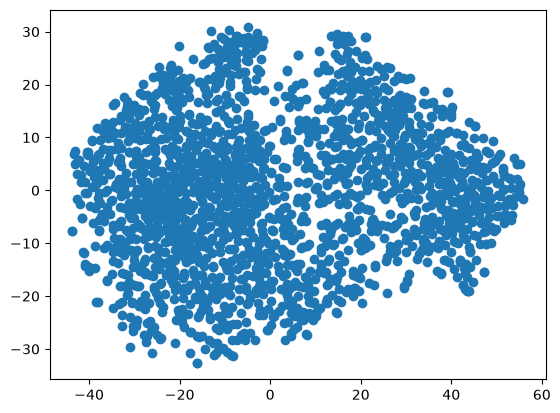

: 

In [ ]:
import matplotlib.pyplot as plt
plt.scatter(dots[:,0], dots[:,1])
plt.show()

In [25]:
from sklearn.decomposition import PCA
pca_dots = PCA(n_components=2).fit_transform(X)

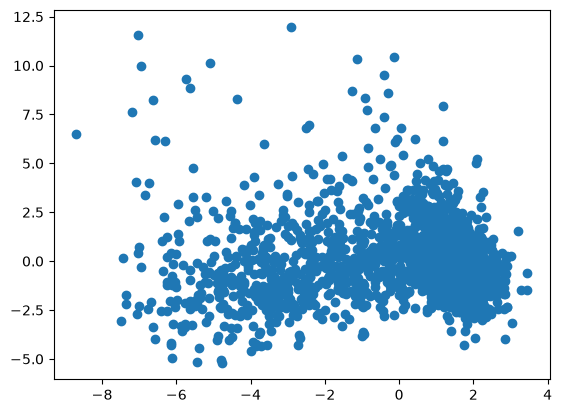

: 

In [ ]:
plt.scatter(pca_dots[:,0], pca_dots[:,1])
plt.show()

In [7]:
import matplotlib.pyplot as plt
from pathlib import Path

In [8]:
csv_paths = [
    "./runs/cluster/run5/losses.csv",
    "./runs/cluster/run6/losses.csv",
    "./runs/cluster/run7/losses.csv",
    "./runs/cluster/run8/losses.csv",
    "./runs/cluster/run9/losses.csv",
    "./runs/cluster/run10/losses.csv",
]

step_mode = "auto"  

smooth = 20

In [3]:
def load_csvs(paths, step_mode="auto"):
    dfs = []
    offset = 0
    last_max_step = -1

    required_cols = {"step", "split", "loss", "lr", "elapsed_min", "kind"}

    for i, path in enumerate(paths):
        df = pd.read_csv(path)

        missing = required_cols - set(df.columns)
        if missing:
            raise ValueError(f"{path} no tiene columnas: {missing}")

        df = df.copy()
        df["source_file"] = Path(path).name
        df = df.sort_values("step")

        min_step = df["step"].min()

        if step_mode == "offset":
            should_offset = True
        elif step_mode == "absolute":
            should_offset = False
        elif step_mode == "auto":
            should_offset = i > 0 and min_step <= last_max_step
        else:
            raise ValueError("step_mode debe ser: auto, absolute u offset")

        if should_offset:
            df["step"] = df["step"] + offset

        dfs.append(df)

        offset = max(offset, df["step"].max() + 1)
        last_max_step = max(last_max_step, df["step"].max())

    full = pd.concat(dfs, ignore_index=True)
    full = full.sort_values(["step", "split", "kind"])

    return full

In [9]:
df = load_csvs(csv_paths, step_mode=step_mode)

df.head()

,step,split,loss,lr,elapsed_min,kind,source_file
0,0,train,9.811438,0.000001,0.089249,eval,losses.csv
2,0,train,9.807938,0.000001,0.092087,train,losses.csv
1,0,val,9.811837,0.000001,0.089249,eval,losses.csv
3,10,train,9.319555,0.000016,0.096838,train,losses.csv
4,20,train,9.040510,0.000031,0.101673,train,losses.csv


In [10]:
df.tail()

,step,split,loss,lr,elapsed_min,kind,source_file
103672,959970,train,3.220332,0.00003,343.383099,train,losses.csv
103673,959980,train,3.127214,0.00003,343.387779,train,losses.csv
103674,959990,train,3.086549,0.00003,343.392468,train,losses.csv
103675,960000,train,3.092411,0.00003,343.422840,eval,losses.csv
103676,960000,val,3.103506,0.00003,343.422840,eval,losses.csv


In [11]:
df.to_csv("losses.csv")

In [109]:
def plot_loss(df, smooth=1, kind=None, split=None):
    plot_df = df.copy()

    if kind is not None:
        plot_df = plot_df[plot_df["kind"] == kind]

    if split is not None:
        plot_df = plot_df[plot_df["split"] == split]

    if plot_df.empty:
        raise ValueError("No quedaron datos después de aplicar los filtros.")

    plt.figure(figsize=(10, 6))

    group_cols = ["split", "kind"]

    for label, group in plot_df.groupby(group_cols):
        group = group.sort_values("step")

        y = group["loss"]

        if smooth > 1:
            y = y.rolling(window=smooth, min_periods=1).mean()

        label = " / ".join(map(str, label))

        plt.plot(group["step"], y, label=label)

    plt.xlabel("Step")
    plt.ylabel("Loss")
    plt.title("Loss por step")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

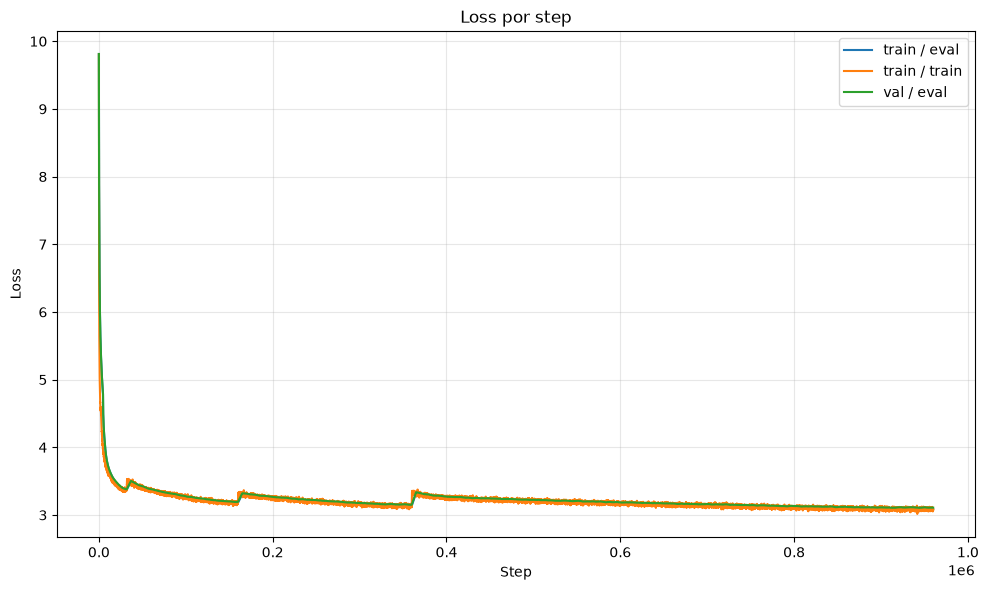

In [110]:
plot_loss(df, smooth=smooth)